In [1]:
import os
os.environ["TF_GPU_ALLOCATOR"] = "cuda_malloc_async"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '0'
#0 = all messages are logged (default behavior)
#1 = INFO messages are not printed
#2 = INFO and WARNING messages are not printed
#3 = INFO, WARNING, and ERROR messages are not printed

#GPU id to use
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="0"

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time, json, cv2

from pathlib import Path

import tensorflow as tf
tf.config.optimizer.set_jit(True)

from tensorflow import keras

from keras import layers
from keras.callbacks import EarlyStopping, ModelCheckpoint, TerminateOnNaN
from keras.mixed_precision import loss_scale_optimizer

from keras import mixed_precision
# mixed_precision.set_global_policy('mixed_float16')

# Check if GPU is available and set memory growth
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

tf.config.experimental.set_virtual_device_configuration(
    gpus[0],
    [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=3800)])

2025-08-04 13:45:39.316128: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-08-04 13:45:40.279091: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2025-08-04 13:45:41.493476: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-08-04 13:45:41.640721: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA n

In [2]:
# Input Settings
MASK_TAG    = 'line.png'
FOLDER      = 'super_mix'

IMAGE_SIZE  = 256
BATCH_SIZE  = 4

L_RATE   = 0.00001
N_EPOCH  = 50
MOBILE = False

net_id  = 'erik_logic_1'

In [3]:
# Overview
TRAIN_DIR   = f"./{FOLDER}/train/"
VAL_DIR     = f"./{FOLDER}/val/"
TEST_DIR    = f"./{FOLDER}/test/"

ex_img = cv2.imread(os.path.join(TEST_DIR, next(f for f in os.listdir(TEST_DIR) if f.lower().endswith(MASK_TAG))), 0)
RATIO = ex_img.shape[1]/ex_img.shape[0]
NUM_CLASSES = len(np.unique(ex_img))
print("Detected number of classes:",NUM_CLASSES)
print("Detected image ratio:", RATIO)

print("XLA JIT:", tf.config.optimizer.get_jit())

#print("Tf version", tf.__version__)
print("TF Keras version:", tf.keras.__version__)
print("GPU device:", tf.test.gpu_device_name())

print('Model name:',str(IMAGE_SIZE)+'px_'+str(N_EPOCH)+'ep_'+str(net_id)+'.hdf5')

Detected number of classes: 2
Detected image ratio: 1.7666666666666666
XLA JIT: autoclustering
TF Keras version: 2.12.0
GPU device: /device:GPU:0
Model name: 256px_50ep_erik_logic_1.hdf5


2025-08-04 13:45:41.688624: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-08-04 13:45:41.690996: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-08-04 13:45:41.693112: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

In [4]:
# Function to get the number of classes in the dataset -- Not used or tested so far
def count_unique_classes(mask_dir, mask_exts=('.png', '.jpg')):
    all_classes = set()
    for fname in os.listdir(mask_dir):
        if fname.lower().endswith(mask_exts):
            path = os.path.join(mask_dir, fname)
            mask = cv2.imread(path, 0)  # Read as grayscale
            if mask is not None:
                all_classes.update(np.unique(mask))
    return len(all_classes), sorted(all_classes)

In [5]:
# Function to decode the categorical segmentation masks to RGB colors (given colormap)
def decode_segmentation_masks(mask, colormap):
    rgb = colormap[mask]
    return rgb.astype(np.uint8)

#color for mask viz
colormap = np.asarray([[ 0,  0, 64], [64,  0, 0], [ 0, 64,  0], [0, 0, 200], [200,  0, 0], [0, 200, 0], [255,255,255]])

In [6]:
# Function to randomly change image brightness and contrast for augmentation
def random_bright_contr(image, mask):
    """
    Randomly changes image brightness and contrast.

    Args:
        image (tf.Tensor): The input image tensor.
        mask (tf.Tensor): The associated mask tensor (not modified).

    Returns:
        tf.Tensor: The modified image tensor with random brightness and contrast.
        tf.Tensor: The unmodified mask tensor.
    """

    uniform_random = tf.random.uniform([], 0, 1.0)

    # Apply random brightness adjustment to the image with a maximum delta of 0.4
    # If uniform_random is less than 0.5, apply the adjustment; otherwise, keep the image unchanged
    image = tf.cond(tf.less(uniform_random, 0.5), lambda: tf.image.random_brightness(image, max_delta=0.4), lambda: image)

    # Generate another uniform random value between 0 and 1
    uniform_random = tf.random.uniform([], 0, 1.0)

    # Apply random contrast adjustment to the image with specified lower and upper bounds (0.75 and 1.4)
    # If uniform_random is less than 0.5, apply the adjustment; otherwise, keep the image unchanged
    image = tf.cond(tf.less(uniform_random, 0.5), lambda: tf.image.random_contrast(image, lower=0.75, upper=1.4), lambda: image)

    # Clip the pixel values of the image to be within the range [-1.0, 1.0]
    image = tf.clip_by_value(image, -1.0, 1.0)

    return image, mask

In [7]:
# Function to randomly flip the image for augmentation -- Deactivated, needs updating for new line logic
def random_flip_image(image, mask, x0, x1):
    """
    Randomly flip an image and label horizontally.

    Args:
        image (tf.Tensor): The input image tensor.
        mask (tf.Tensor): The associated mask tensor.
        x0 (tf.Tensor): A value representing x0 coordinate (used for bounding boxes).
        x1 (tf.Tensor): A value representing x1 coordinate (used for bounding boxes).

    Returns:
        tf.Tensor: The modified image tensor (flipped or unchanged).
        tf.Tensor: The modified mask tensor (flipped or unchanged).
        tf.Tensor: The modified x0 coordinate (flipped or adjusted).
        tf.Tensor: The modified x1 coordinate (flipped or adjusted).
    """

    uniform_random = tf.random.uniform([], 0, 1.0)

    # Determine if a horizontal flip should be applied (50% probability)
    flipH_cond = tf.less(uniform_random, 0.5)

    image = tf.cond(flipH_cond, lambda: tf.image.flip_left_right(image), lambda: image)
    mask = tf.cond(flipH_cond, lambda: tf.image.flip_left_right(mask), lambda: mask)

    # Adjust X0/X1 if a horizontal flip was applied
    if flipH_cond:
        x0 = (0.5 - x0) + 0.5
        x1 = (0.5 - x1) + 0.5

    return image, mask, x0, x1

In [8]:
def point_to_border_igor(image_width, image_height, start, end): # New line logic: Pixel in the border to border value
    w = image_width
    h = image_height

    x1, y1 = start
    x2, y2 = end

    if y1>y2:
        # Swap points if the line is going downwards
        aux = x2, y2, x1, y1
        x1, y1, x2, y2 = aux
        #print("Swapping points to ensure y1 <= y2")
        #print(f"Start: ({x1},{y1}), End: ({x2},{y2})", f"Width: {w}, Height: {h} - before conversion - swapped")
    else:
        #print(f"Start: ({x1},{y1}), End: ({x2},{y2})", f"Width: {w}, Height: {h} - before conversion")
        pass
    
    if y2==h:
        if y1==0:
            #print("Line A-Alpha")
            val1 = h+x2
            val2 = h+x1
        elif x1==0:
            #print("Line B-Beta")
            val1 = h+x2
            val2 = h-y1
        elif x1==w:
            #print("Line C-Gama")
            val1 = h+x2
            val2 = h+w+y1
        else: 
            val1 = None
            val2 = None
    elif x2==0:
        if y1==0:
            #print("Line D-Alpha")
            val1 = y2
            val2 = h+x1
        elif x1==w:
            #print("Line E-Gama")
            val1 = y2
            val2 = h+w+y1
        else:
            val1 = None
            val2 = None
    elif x2==w:
        if y1==0:
            #print("Line F-Alpha")
            val1 = 2*h+w-y2
            val2 = h+x1
        elif x1==0:
            #print("Line G-Beta",h,y1,y2)
            val1 = 2*h+w-y2
            val2 = h-y1
        else:
            val1 = None
            val2 = None
    else:
        val1 = None
        val2 = None
    
    if val1 is not None and val2 is not None:
        #print(f"Intersection values: {val1}, {val2}")
        pass
    else:
        #print("No valid intersection values found.")
        val1 = 0
        val2 = 0

    return val1, val2

In [9]:
def border_to_point_igor(image_width, image_height, val1, val2): # New line logic: Border value to pixel in the border
    w = image_width
    h = image_height

    if val2<h:
        x1 = 0
        y1 = h-val2
    elif val2>h+w:
        x1 = w
        y1 = val2-h-w
    else:
        x1 = val2-h
        y1 = 0
    
    if val1<h:
        x2 = 0
        y2 = val1
    elif val1>h+w:
        x2 = w
        y2 = 2*h+w-val1
    else:
        x2 = val1-h
        y2 = h
    
    return (x1, y1), (x2, y2)

In [10]:
# New line logic from Erik
def point_to_border(image_width, image_height, start, end):
    w = image_width
    h = image_height

    x1, y1 = start
    x2, y2 = end

    if y1>y2:
        aux = x2, y2, x1, y1
        x1, y1, x2, y2 = aux

    else:
        pass
    
    if y2==h:
        if y1==0:
            #print("Line A-Alpha")
            val1 = h/2 + x2
            val2 = h/2 + x1
        elif x1==0:
            #print("Line B-Beta")
            val1 = h/2 + x2
            val2 = h/2 - y1
        elif x1==w:
            #print("Line C-Gama")
            val1 = h/2 + x2
            val2 = h/2 + w + y1
        else: 
            val1 = None
            val2 = None

    elif x2==0:
        if y1==0:
            #print("Line D-Alpha")
            val1 = y2 - h/2
            val2 = h/2 + x1
        elif x1==w:
            #print("Line E-Gama")
            val1 = y2 - h/2
            val2 = h/2 + w + y1
        else:
            val1 = None
            val2 = None

    elif x2==w:
        if y1==0:
            #print("Line F-Alpha")
            val1 = h + w - (y2 - h/2)
            val2 = h/2 + x1
        elif x1==0:
            #print("Line G-Beta",h,y1,y2)
            val1 = h + w - (y2 - h/2)
            val2 = h/2 - y1
        else:
            val1 = None
            val2 = None
    else:
        val1 = None
        val2 = None
    
    if val1 is not None and val2 is not None:
        #print(f"Intersection values: {val1}, {val2}")
        pass
    else:
        #print("No valid intersection values found.")
        val1 = 0
        val2 = 0

    return val1, val2

In [11]:
# New line logic from Erik
def border_to_point(image_width, image_height, val1, val2):
    w = image_width
    h = image_height

    if val2<h/2:
        x1 = 0
        y1 = h/2-val2
    elif val2>h/2+w:
        x1 = w
        y1 = val2-h/2-w
    else:
        x1 = val2-h/2
        y1 = 0
    
    if val1<h/2:
        x2 = 0
        y2 = val1 + h/2
    elif val1>h/2+w:
        x2 = w
        y2 = h+w-(val1 - h/2)
    else:
        x2 = val1-h/2
        y2 = h
    
    return (x1, y1), (x2, y2)

In [12]:
# image_width = 256
# image_height = 256
# start = (256, 0)  # Example start point
# end = (256, 128)  # Example end point

# vvvv1, vvvv2 = point_to_border(image_width, image_height, start, end)
# pix1, pix2   = border_to_point(image_width, image_height, vvvv1, vvvv2)

# print("vvvv1:", vvvv1, "vvvv2:", vvvv2)
# print("pix1:", pix1, "pix2:", pix2)

In [13]:
# Functions to read data for the dataset (image, mask, json)
# Function read the image from path
def read_image(image_path, mask=False):
    image = tf.io.read_file(image_path)
    if mask:
        image = tf.image.decode_png(image, channels=1)
        image.set_shape([None, None, 1])
        image = tf.image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE], method='nearest')
    else:
        image = tf.image.decode_png(image, channels=3)
        image.set_shape([None, None, 3])
        image = tf.image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
        image = image / 127.5 - 1
    return image

# Function to read points from json path
def read_pt(json_path):
    # Read JSON file containing two points
    with open(json_path, 'r') as f:
        data = json.load(f)

    # Load the corresponding image (same path with 'img.jpg' instead of 'line.json')
    image = cv2.imread(json_path.replace('line.json', 'img.png'))
    h = image.shape[0]  # Image height
    w = image.shape[1]  # Image width

    # Extract original points from the JSON data
    (x1, y1) = data["pt2"]
    (x2, y2) = data["pt1"]

    ## ----- Example Logic for line handling ----- ##

    # Adjust points to match a square input image of size IMAGE_SIZE
    # (original image might not be square, scale coordinates)
    pt1 = (x1 * IMAGE_SIZE / w, y1 * IMAGE_SIZE / h)
    pt2 = (x2 * IMAGE_SIZE / w, y2 * IMAGE_SIZE / h)

    # Convert pixel coordinates to model-specific "border values"
    val1, val2 = point_to_border(IMAGE_SIZE, IMAGE_SIZE, pt1, pt2)

    # Normalize the output values to the range
    #val1 = val1 / (3 * IMAGE_SIZE)
    #val2 = val2 / (3 * IMAGE_SIZE)
    #val1 = 1 / (1 + np.exp(-(val1 - 1.5 * IMAGE_SIZE) / (IMAGE_SIZE/2.5))) #igor logic
    #val2 = 1 / (1 + np.exp(-(val2 - 1.5 * IMAGE_SIZE) / (IMAGE_SIZE/2.5))) #igor logic
    val1 = 1 / (1 + np.exp(-(val1 - 1.0 * IMAGE_SIZE) / (IMAGE_SIZE/3.5))) #erik logic
    val2 = 1 / (1 + np.exp(-(val2 - 1.0 * IMAGE_SIZE) / (IMAGE_SIZE/3.5))) #erik logic

    return val1, val2


In [2]:
import numpy as np
IMAGE_SIZE = 256
1 / (1 + np.exp(-(128+256 - 1.0 * IMAGE_SIZE) / (IMAGE_SIZE/3.5))) 

0.8519528019683106

In [14]:
# Data generator loaders

# Data loader (mask + line)
def load_data(image_list, mask_list, x0_list, x1_list):
    image = read_image(image_list)
    mask  = read_image(mask_list, mask=True)

    x0 = x0_list
    x1 = x1_list

    image,mask = random_bright_contr(image, mask)
    image,mask,x0,x1 = random_flip_image(image, mask, x0, x1)
    
    return image, (mask, x0, x1)

# Data generator (mask + line)
def data_generator(image_list, mask_list, line_list):
    X0_list, X1_list = zip(*[read_pt(line) for line in line_list])
    X0_list = list(X0_list)
    X1_list = list(X1_list)
    print("loaded - img:",len(image_list)," - msk",len(mask_list)," - X0:",len(X0_list)," - X1",len(X1_list))

    dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list, X0_list, X1_list))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size = 100 * BATCH_SIZE) 
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    
    return dataset

# Data generator (Line only)
def load_data_no_mask(image_list,  x0_list, x1_list):
    image = read_image(image_list)

    x0 = x0_list
    x1 = x1_list

    image,_ = random_bright_contr(image,image)
    image,_,x0,x1 = random_flip_image(image,image, x0, x1)
    
    return image, (x0, x1)

In [15]:
# Functions to get file list from folder
def loadpath_img(my_path):
    files = []
    for path in Path(my_path).rglob('*img.jpg'):
        if "erik" in str(path):
            files.append(str(path))
    #if len(files) < 1:
    for path in Path(my_path).rglob('*img.png'):
        if "erik" in str(path):
            files.append(str(path))
    #print('PNG images detected, for better reliability use jpg for the images')
    files.sort()
    files.sort(key=lambda x: int(''.join(filter(str.isdigit, os.path.basename(x))) or 0))
    return files

def loadpath_msk(my_path):
    files = []
    for path in Path(my_path).rglob('*'+MASK_TAG):
        if "erik" in str(path):
            files.append(str(path))
    files.sort()
    files.sort(key=lambda x: int(''.join(filter(str.isdigit, os.path.basename(x))) or 0))
    return files

def loadpath_lbl(my_path):
    files = []
    for path in Path(my_path).rglob('*_line.json'):
        if "erik" in str(path):
            files.append(str(path))
    files.sort()
    files.sort(key=lambda x: int(''.join(filter(str.isdigit, os.path.basename(x))) or 0))
    return files

In [16]:
# Network Model blocks
def convolution_block(
    block_input,
    num_filters=256,
    kernel_size=3,
    dilation_rate=1,
    padding="same",
    use_bias=False,
):
    x = layers.Conv2D(
        num_filters,
        kernel_size=kernel_size,
        dilation_rate=dilation_rate,
        padding="same",
        use_bias=use_bias,
        kernel_initializer=keras.initializers.HeNormal(),
    )(block_input)
    x = layers.BatchNormalization()(x)
    return tf.nn.relu(x)

def DilatedSpatialPyramidPooling(dspp_input):
    dims = dspp_input.shape
    x = layers.AveragePooling2D(pool_size=(dims[-3], dims[-2]))(dspp_input)
    x = convolution_block(x, kernel_size=1, use_bias=True)
    out_pool = layers.UpSampling2D(
        size=(dims[-3] // x.shape[1], dims[-2] // x.shape[2]), interpolation="bilinear",
    )(x)

    out_1 = convolution_block(dspp_input, kernel_size=1, dilation_rate=1)
    out_6 = convolution_block(dspp_input, kernel_size=3, dilation_rate=6)
    out_12 = convolution_block(dspp_input, kernel_size=3, dilation_rate=12)
    out_18 = convolution_block(dspp_input, kernel_size=3, dilation_rate=18)

    x = layers.Concatenate(axis=-1)([out_pool, out_1, out_6, out_12, out_18])
    output = convolution_block(x, kernel_size=1)
    return output

def get_x0(x):
    shape = x.shape

    flatten = layers.Flatten(input_shape=shape)(x)
    hidden_layer = layers.Dense(25, activation='relu', use_bias=True)(flatten)
    hidden_layer = layers.Dense(20, activation='relu', use_bias=True)(hidden_layer)
    output_x0 = layers.Dense(1, activation='sigmoid', use_bias=True, name="x0")(hidden_layer)

    return output_x0

def get_x1(x):
    shape = x.shape

    flatten = layers.Flatten(input_shape=shape)(x)
    hidden_layer = layers.Dense(25, activation='relu', use_bias=True)(flatten)
    hidden_layer = layers.Dense(20, activation='relu', use_bias=True)(hidden_layer)
    output_x1 = layers.Dense(1, activation='sigmoid', use_bias=True, name="x1")(hidden_layer)

    return output_x1

In [17]:
# DeeplabV3+ | RESNET50 + Line pred
def DeeplabV3Plus(image_size, num_classes):
    model_input = keras.Input(shape=(image_size, image_size, 3))
    resnet50 = keras.applications.ResNet50(
        weights="imagenet", include_top=False, input_tensor=model_input
    )
    x = resnet50.get_layer("conv4_block6_2_relu").output

    x1_out = get_x1(x)
    x0_out = get_x0(x)

    x = DilatedSpatialPyramidPooling(x)

    input_a = layers.UpSampling2D(
        size=(image_size // 4 // x.shape[1], image_size // 4 // x.shape[2]),
        interpolation="bilinear",
    )(x)
    input_b = resnet50.get_layer("conv2_block3_2_relu").output
    input_b = convolution_block(input_b, num_filters=48, kernel_size=1)

    x = layers.Concatenate(axis=-1)([input_a, input_b])
    x = convolution_block(x)
    x = convolution_block(x)

    x = layers.UpSampling2D(
        size=(image_size // x.shape[1], image_size // x.shape[2]),
        interpolation="bilinear",
    )(x)

    model_output = layers.Conv2D(num_classes, kernel_size=(1, 1), padding="same")(x)
    model_output = tf.keras.layers.Activation("linear", dtype="float32", name="mask")(model_output)
    
    return keras.Model(inputs=model_input, outputs=[model_output, x0_out, x1_out])


In [18]:
# DeeplabV3+ | MobileNetV2 + Line pred
def DeeplabV3_mobile2(image_size, num_classes):
    model_input = keras.Input(shape=(image_size, image_size, 3))
    MobileNet2 = keras.applications.MobileNetV2(
        weights="imagenet", include_top=False, input_tensor=model_input
    )
    x = MobileNet2.get_layer("block_16_project_BN").output

    x = DilatedSpatialPyramidPooling(x)

    x1_out = get_x1(x)
    x0_out = get_x0(x)

    input_a = layers.UpSampling2D(
        size=(image_size // 4 // x.shape[1], image_size // 4 // x.shape[2]),
        interpolation="bilinear",
    )(x)
    input_b = MobileNet2.get_layer("block_2_add").output 
    input_b = convolution_block(input_b, num_filters=48, kernel_size=1)

    # Determine the desired spatial dimensions
    desired_height = input_b.shape[1]
    desired_width = input_b.shape[2]

    # Calculate the padding to add to input_b
    pad_height = desired_height - input_a.shape[1]
    pad_width = desired_width - input_a.shape[2]

    # Ensure the padding values are non-negative
    pad_height = max(0, pad_height)
    pad_width = max(0, pad_width)

    # Define the padding tensor
    padding = tf.constant([[0, 0], [pad_height // 2, pad_height // 2], [pad_width // 2, pad_width // 2], [0, 0]])

    # Pad input_b
    input_a = tf.pad(input_a, padding, "CONSTANT", constant_values=0)

    # Now, input_b has the same spatial dimensions as input_a
    # You can proceed to concatenate them
    x = layers.Concatenate(axis=-1)([input_a, input_b])

    x = convolution_block(x)
    x = convolution_block(x)

    x = layers.UpSampling2D(
        size=(image_size // x.shape[1], image_size // x.shape[2]),
        interpolation="bilinear",
    )(x)

    model_output = layers.Conv2D(num_classes, kernel_size=(1, 1), padding="same")(x)
    model_output = tf.keras.layers.Activation("linear", dtype="float32", name="mask")(model_output)
    return keras.Model(inputs=model_input, outputs=[model_output, x0_out, x1_out])

In [19]:
# Dataset generation and size checks
train_images = loadpath_img(TRAIN_DIR)
train_masks  = loadpath_msk(TRAIN_DIR)
train_txts   = loadpath_lbl(TRAIN_DIR)

val_images = loadpath_img(VAL_DIR)
val_masks  = loadpath_msk(VAL_DIR)
val_txts   = loadpath_lbl(VAL_DIR)

test_images = loadpath_img(TEST_DIR)
test_masks  = loadpath_msk(TEST_DIR)
test_txts   = loadpath_lbl(TEST_DIR)

print("File Paths:")

print(train_images[0:3],  len(train_images))
print(train_masks[0:3], len(train_masks))
print(train_txts[0:3], len(train_txts))

print("\nTrain Dataset Structure:")

train_dataset = data_generator(train_images, train_masks, train_txts)

print("Input:",    tf.data.experimental.get_structure(train_dataset)[0])
print("Output 1:", tf.data.experimental.get_structure(train_dataset)[1][0])
print("Output 2:",  tf.data.experimental.get_structure(train_dataset)[1][1])
print("Output 3:",  tf.data.experimental.get_structure(train_dataset)[1][2])

print("\nVal Dataset Structure:")
val_dataset = data_generator(val_images  , val_masks, val_txts)
print("Input:",    tf.data.experimental.get_structure(val_dataset)[0])
print("Output 1:", tf.data.experimental.get_structure(val_dataset)[1][0])
print("Output 2:",  tf.data.experimental.get_structure(val_dataset)[1][1])
print("Output 3:",  tf.data.experimental.get_structure(val_dataset)[1][2])

File Paths:
['super_mix/train/erik_image_0000_img.png', 'super_mix/train/erik_image_0001_img.png', 'super_mix/train/erik_image_0002_img.png'] 166
['super_mix/train/erik_image_0000_line.png', 'super_mix/train/erik_image_0001_line.png', 'super_mix/train/erik_image_0002_line.png'] 166
['super_mix/train/erik_image_0000_line.json', 'super_mix/train/erik_image_0001_line.json', 'super_mix/train/erik_image_0002_line.json'] 166

Train Dataset Structure:
loaded - img: 166  - msk 166  - X0: 166  - X1 166


2025-08-04 13:45:43.412836: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-08-04 13:45:43.414454: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-08-04 13:45:43.415880: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

Input: TensorSpec(shape=(4, 256, 256, 3), dtype=tf.float32, name=None)
Output 1: TensorSpec(shape=(4, 256, 256, 1), dtype=tf.uint8, name=None)
Output 2: TensorSpec(shape=(4,), dtype=tf.float64, name=None)
Output 3: TensorSpec(shape=(4,), dtype=tf.float64, name=None)

Val Dataset Structure:
loaded - img: 47  - msk 47  - X0: 47  - X1 47
Input: TensorSpec(shape=(4, 256, 256, 3), dtype=tf.float32, name=None)
Output 1: TensorSpec(shape=(4, 256, 256, 1), dtype=tf.uint8, name=None)
Output 2: TensorSpec(shape=(4,), dtype=tf.float64, name=None)
Output 3: TensorSpec(shape=(4,), dtype=tf.float64, name=None)


2025-08-04 13:45:44.185727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype double and shape [47]
	 [[{{node Placeholder/_2}}]]
2025-08-04 13:45:44.186076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_3' with dtype double and shape [47]
	 [[{{node Placeholder/_3}}]]
2025-08-04 13:45:44.256415: W tensorflow/compiler/jit/mark_for_compilation_pass.cc:1780] (One-time warning): Not using XLA:CPU for cluster.

If you want XLA:CPU, do one of the following:

 - set the TF_XLA_FLAGS to include "--tf_xla_cpu_global_jit", or
 - set cpu_global_jit to true on this session's OptimizerOption

X0,(122, 0) | X1,(122, 256) | [0 1] Val1: 250.00 Val2: 250.00
X0,(105, 0) | X1,(81, 256) | [0 1] Val1: 209.00 Val2: 233.00
X0,(160, 0) | X1,(193, 256) | [0 1] Val1: 321.00 Val2: 288.00
X0,(174, 0) | X1,(184, 256) | [0 1] Val1: 312.00 Val2: 302.00
X0,(130, 0) | X1,(129, 256) | [0 1] Val1: 257.00 Val2: 258.00
X0,(126, 0) | X1,(127, 256) | [0 1] Val1: 255.00 Val2: 254.00
X0,(122, 0) | X1,(124, 256) | [0 1] Val1: 252.00 Val2: 250.00
X0,(192, 0) | X1,(162, 256) | [0 1] Val1: 290.00 Val2: 320.00


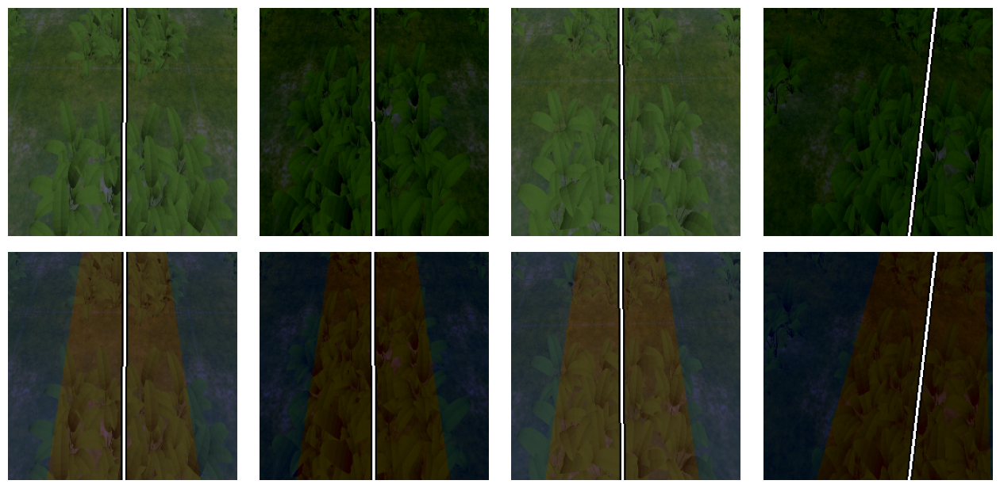

In [20]:
# Data visualization
plt.figure(figsize=(16, 8))
plt.subplots_adjust(wspace=0.1, hspace=0.0)

for images, y_true in val_dataset.take(2):

    masks=y_true[0]
    val1=y_true[1].numpy()
    val2=y_true[2].numpy()

    viz_range = min(4,2*BATCH_SIZE)
    for i in range(viz_range):

        # Line logic
        #val1[i] = val1[i]* (3 * IMAGE_SIZE)
        #val2[i] = val2[i]* (3 * IMAGE_SIZE)
        val1[i] = float(np.clip(val1[i], 1e-6, 1 - 1e-6))
        val2[i] = float(np.clip(val2[i], 1e-6, 1 - 1e-6))
        #val1[i] = int(np.round(- (IMAGE_SIZE / 2.5) * np.log((1 - val1[i]) / val1[i]) + 1.5 * IMAGE_SIZE))
        #val2[i] = int(np.round(- (IMAGE_SIZE / 2.5) * np.log((1 - val2[i]) / val2[i]) + 1.5 * IMAGE_SIZE))

        val1[i] = int(np.round(- (IMAGE_SIZE / 3.5) * np.log((1 - val1[i]) / val1[i]) + 1.0 * IMAGE_SIZE))
        val2[i] = int(np.round(- (IMAGE_SIZE / 3.5) * np.log((1 - val2[i]) / val2[i]) + 1.0 * IMAGE_SIZE))

        pt1, pt2 = border_to_point(IMAGE_SIZE,IMAGE_SIZE,val1[i],val2[i])
        x1, y1 = pt1
        x2, y2 = pt2
        x1, y1 = round(x1), round(y1)
        x2, y2 = round(x2), round(y2)

        print(f'X0,{x1, y1} | X1,{x2, y2} | {np.unique(masks[i])} Val1: {val1[i]:0.2f} Val2: {val2[i]:0.2f}')

        img = np.asarray(((images[i]+1)/2).numpy()*250,dtype=np.uint8)
        img = cv2.line(img, (x1, y1), (x2, y2), (0, 0, 0),6)
        img = cv2.line(img, (x1, y1), (x2, y2), (255, 255, 255),2)
        plt.subplot(int(max(2,viz_range/2)), int(viz_range), i + 1)
        plt.imshow(img)
        plt.axis("off")

        plt.subplot(int(max(2,viz_range/2)), int(viz_range), i + 1 + viz_range)
        msk = decode_segmentation_masks(np.squeeze(masks[i]), colormap)
        out = cv2.addWeighted(img, 0.7, msk, 0.4, 0)
        img = cv2.line(out, (x1, y1), (x2, y2), (0, 0, 0),6)
        out = cv2.line(out, (x1, y1), (x2, y2), (255, 255, 255),2)
        plt.imshow(out)
        plt.axis("off")

2025-08-04 13:45:45.243070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [166]
	 [[{{node Placeholder/_0}}]]
2025-08-04 13:45:45.243930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [166]
	 [[{{node Placeholder/_0}}]]


X0,(136, 0) | X1,(136, 256) | [0 1] Val1: 264.00 Val2: 264.00


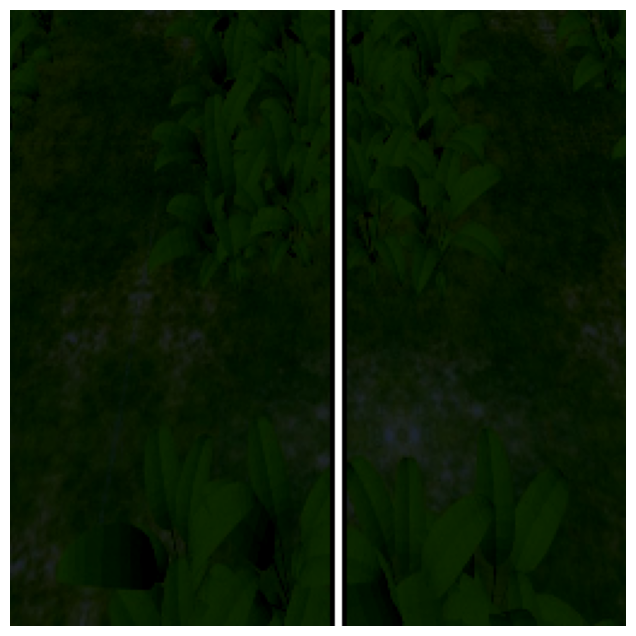

In [21]:
# Plot one image
# Data visualization: single image
plt.figure(figsize=(8, 8))
plt.axis("off")

for images, y_true in train_dataset.take(1):
    masks = y_true[0]
    val1 = y_true[1].numpy()
    val2 = y_true[2].numpy()

    # just pick the first example (or change index if you want a different one)
    i = 0

    # clamp and transform
    val1[i] = float(np.clip(val1[i], 1e-6, 1 - 1e-6))
    val2[i] = float(np.clip(val2[i], 1e-6, 1 - 1e-6))
    val1[i] = int(np.round(- (IMAGE_SIZE / 3.5) * np.log((1 - val1[i]) / val1[i]) + 1.0 * IMAGE_SIZE))
    val2[i] = int(np.round(- (IMAGE_SIZE / 3.5) * np.log((1 - val2[i]) / val2[i]) + 1.0 * IMAGE_SIZE))

    pt1, pt2 = border_to_point(IMAGE_SIZE, IMAGE_SIZE, val1[i], val2[i])
    x1, y1 = map(round, pt1)
    x2, y2 = map(round, pt2)

    print(f'X0,{(x1, y1)} | X1,{(x2, y2)} | {np.unique(masks[i])} Val1: {val1[i]:0.2f} Val2: {val2[i]:0.2f}')

    img = np.asarray(((images[i] + 1) / 2).numpy() * 250, dtype=np.uint8)
    img_with_line = cv2.line(img.copy(), (x1, y1), (x2, y2), (0, 0, 0), 6)
    img_with_line = cv2.line(img_with_line, (x1, y1), (x2, y2), (255, 255, 255), 2)

    # overlay mask
    msk = decode_segmentation_masks(np.squeeze(masks[i]), colormap)
    blended = cv2.addWeighted(img_with_line, 0.7, msk, 0.4, 0)
    blended = cv2.line(blended, (x1, y1), (x2, y2), (0, 0, 0), 6)
    blended = cv2.line(blended, (x1, y1), (x2, y2), (255, 255, 255), 2)

    # show final composite
    plt.imshow(img_with_line)
    plt.imsave("img.jpg", img_with_line)
    plt.show()
    break  # only one image


In [22]:
# Callbacks for Trainig phase
early_stopping = EarlyStopping(monitor='val_x1_mae', patience=20, min_delta=0.0001, mode='min', restore_best_weights=True)

#mcp_save = ModelCheckpoint(os.path.join(os.getcwd(), 'weights/'+str(IMAGE_SIZE) + 'px_' + str(N_EPOCH) + 'ep_' + str(net_id) + '_checkpt.hdf5'),
#                           save_best_only=True, monitor='val_accuracy', mode='min')

terminate = TerminateOnNaN()

In [30]:
from math import cos, sin, pi
import numpy as np
theta = 1
r = np.array([[cos(theta), -sin(theta), 0],[sin(theta), cos(theta), 0],[0, 0, 1]])

print(r, "\n", np.linalg.inv(r))

[[ 0.54030231 -0.84147098  0.        ]
 [ 0.84147098  0.54030231  0.        ]
 [ 0.          0.          1.        ]] 
 [[ 0.54030231  0.84147098  0.        ]
 [-0.84147098  0.54030231 -0.        ]
 [ 0.          0.          1.        ]]


In [23]:
losses = {
    "mask": keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    "x0": keras.losses.MeanAbsoluteError(),
    "x1": keras.losses.MeanAbsoluteError()
}

loss_weights = {
    "mask": 1.0,
    "x0": 5.0,
    "x1": 5.0
}

opt = keras.optimizers.Adam(learning_rate=L_RATE)
opt = loss_scale_optimizer.LossScaleOptimizerV3(opt)

# Training preparation
if MOBILE: 
    model = DeeplabV3_mobile2(image_size=IMAGE_SIZE, num_classes=NUM_CLASSES)
    model.compile(
    optimizer=opt,
    loss=losses,
    loss_weights=loss_weights,
    metrics={'mask': ['accuracy'], 
                'x0': ['mae'],
                'x1': ['mae']})
    print('Mobile model created')
else:
    model = DeeplabV3Plus(image_size=IMAGE_SIZE, num_classes=NUM_CLASSES)
    model.compile(
    optimizer=opt,
    loss=losses,
    loss_weights=loss_weights,
    metrics={'mask': ['accuracy'], 
                'x0': ['mae'],
                'x1': ['mae']})
    print('ResNet model created')


ResNet model created


In [24]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [56]:
from tensorflow.keras.utils import plot_model


plot_model(model, to_file='model_architecture.png', show_shapes=True, show_dtype=False, rankdir='TB')


In [ ]:
start_time = time.time()
history = model.fit(train_dataset, validation_data=val_dataset, epochs=N_EPOCH, callbacks=[terminate]) #mcp_save
end_time = time.time()

In [ ]:
# Training Stats Plots
plt.figure(figsize=(20,8))
plt.subplots_adjust(wspace=0.13, hspace=0.25)
plt.rcParams.update({'font.size': 7})

plt.subplot(2, 3, 1)
plt.plot(history.history['x0_loss'],'-p', markersize=2, linewidth=1)
plt.plot(history.history['val_x0_loss'],'-p', markersize=2, linewidth=1)
plt.title('X0 loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','val'], loc='upper right')
plt.ylim([0, 0.26])
plt.yticks(np.arange(0, 0.26, 0.05))

plt.subplot(2, 3, 4)
plt.plot(history.history['x0_mae'],'-p', markersize=2, linewidth=1)
plt.plot(history.history['val_x0_mae'],'-p', markersize=2, linewidth=1)
plt.title('X0 MAE')
plt.ylabel('Mean Average Error')
plt.xlabel('epoch')
plt.legend(['train','val'], loc='upper right')
plt.ylim([0, 0.10])
plt.yticks(np.arange(0, 0.11, 0.02))

plt.subplot(2, 3, 2)
plt.plot(history.history['x1_loss'],'-p', markersize=2, linewidth=1)
plt.plot(history.history['val_x1_loss'],'-p', markersize=2, linewidth=1)
plt.title('X1 loss')
plt.xlabel('epoch')
plt.legend(['train','val'], loc='upper right')
plt.ylim([0, 0.26])
plt.yticks(np.arange(0, 0.26, 0.05))

plt.subplot(2, 3, 5)
plt.plot(history.history['x1_mae'],'-p', markersize=2, linewidth=1)
plt.plot(history.history['val_x1_mae'],'-p', markersize=2, linewidth=1)
plt.title('X1 MAE')
plt.xlabel('epoch')
plt.legend(['train','val'], loc='upper right')
plt.ylim([0, 0.10])
plt.yticks(np.arange(0, 0.11, 0.02))

plt.subplot(2, 3, 3)
plt.plot(history.history['mask_loss'],'-p', markersize=2, linewidth=1)
plt.plot(history.history['val_mask_loss'],'-p', markersize=2, linewidth=1)
plt.title('mask loss')
plt.xlabel('epoch')
plt.legend(['train','val'], loc='upper right')
plt.ylim([0, 2])
plt.yticks(np.arange(0, 2, 0.1))

plt.subplot(2, 3, 6)
plt.plot(history.history['mask_accuracy'],'-p', markersize=2, linewidth=1)
plt.plot(history.history['val_mask_accuracy'],'-p', markersize=2, linewidth=1)
plt.title('mask accuracy')
plt.xlabel('epoch')
plt.ylabel('Accuracy')
plt.legend(['train','val'], loc='upper right')
plt.ylim([0, 1])
plt.yticks(np.arange(0, 1, 0.1))

plt.show()

total_time = end_time - start_time

print("Total time: ", total_time)


In [98]:
def angle_with_neg_y(p1, p2, signed=True):
    dx, dy = p2[0]-p1[0], p2[1]-p1[1]
    ang = math.atan2(dy, dx) + math.pi/2
    if ang > math.pi:
        ang -= 2*math.pi
    return ang

In [99]:
pt1, pt2 = (256,256), (230,0)

t1 = sq_fit_line(pt1, pt2, 256,256)
t2 = angle_with_neg_y(pt1, pt2)
print('\n',t1,t2)

-0.10121544166746643 0.10156249999999986

 -0.10121544166746643 -0.10121544166746665


In [ ]:
# Save CSV history from training and Final Weights

# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(history.history) 

# save to csv: 
hist_csv_file = 'weights/'+str(IMAGE_SIZE)+'px_'+str(N_EPOCH)+'ep_'+str(net_id)+'.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

model.save_weights('weights/'+str(IMAGE_SIZE)+'px_'+str(N_EPOCH)+'ep_'+str(net_id)+'.hdf5')

In [25]:
# model.load_weights('weights/'+str(IMAGE_SIZE)+'px_'+str(N_EPOCH)+'ep_'+str(net_id)+'.hdf5')
model.load_weights(str(IMAGE_SIZE)+'px_'+str(N_EPOCH)+'ep_'+str(net_id)+'.hdf5')

In [40]:
# Functions for vizualization
#def infer(model, image_tensor):
#    inputs = tf.expand_dims(image_tensor, axis=0)
#    # mask = model.predict(np.expand_dims((image_tensor), axis=0), verbose = 0)
#    mask = model(inputs, training=False)  # same as model.call(inputs, training=False) 
#    predictions = tf.squeeze(mask)
#    return predictions

@tf.function(jit_compile=True)
def infer_tensor(inputs):
    mask, val1, val2 = model(inputs, training=False)
    return tf.squeeze(mask), tf.squeeze(val1), tf.squeeze(val2)

def infer(model, image_tensor):
    inputs = tf.expand_dims(image_tensor, axis=0)
    return infer_tensor(inputs)

def get_overlay(image, colored_mask):
    image = tf.keras.preprocessing.image.array_to_img(image)
    colored_mask = tf.keras.preprocessing.image.array_to_img(colored_mask)
    
    image = np.array(image).astype(np.uint8)
    colored_mask = np.array(colored_mask).astype(np.uint8)

    overlay = cv2.addWeighted(image, 0.5, colored_mask, 0.5, 0)
    return overlay

def plot_samples_matplotlib(display_list, figsize=(8, 3)):
    fig, axes = plt.subplots(nrows=1, ncols=len(display_list), figsize=figsize)
    
    if len(display_list) == 1:
        axes = [axes]
    
    for i in range(len(display_list)):
        ax = axes[i]
        ax.axis('off')

        img = display_list[i]
        if img.shape[-1] == 3:
            ax.imshow(tf.keras.preprocessing.image.array_to_img(img))
        else:
            ax.imshow(img, cmap='gray')
    
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.tight_layout(pad=1)
    plt.show()

def calculate_iou(mask_true, mask_pred, num_classes, return_per_class=False):
    """
    Compute mean IoU between ground truth and prediction for multi-class masks.
    Both masks should be (H, W) arrays of class indices.

    Parameters:
        mask_true (np.ndarray): Ground truth mask.
        mask_pred (np.ndarray): Predicted mask.
        num_classes (int): Total number of possible classes (e.g., 6 for classes 0–5).
        return_per_class (bool): If True, return a dict of per-class IoUs as well.

    Returns:
        float: Mean IoU over valid classes.
        dict (optional): Per-class IoU values for classes with union > 0.
    """
    ious = {}
    for cls in range(num_classes):
        true_cls = (mask_true == cls)
        pred_cls = (mask_pred == cls)

        intersection = np.logical_and(true_cls, pred_cls).sum()
        union = np.logical_or(true_cls, pred_cls).sum()

        if union == 0:
            continue  # Ignore classes not present in either mask
        ious[cls] = intersection / union

    mean_iou = np.mean(list(ious.values())) if ious else 0.0

    if return_per_class:
        return mean_iou, ious
    return mean_iou

def plot_predictions(images_list, colormap, model):
    proc_time = []; iou = []; line_errors = []; val1_errors = []; val2_errors = []
    i = 0
    
    for image_file in images_list:
        
        # Ground truth processing ------------------
        image_tensor = read_image(image_file)
        val1_true, val2_true = read_pt(image_file.replace('img.png','line.json'))

        mask_true_class = read_image(image_file.replace('img.png', MASK_TAG), mask=True)
        mask_true       = decode_segmentation_masks(np.squeeze(mask_true_class, axis=2), colormap)

        overlay_true = get_overlay(image_tensor, mask_true)

        # Line logic ------------------------------
        # val1_true = val1_true * (3 * IMAGE_SIZE)
        # val2_true = val2_true * (3 * IMAGE_SIZE)
        val1_true = int(np.round(- (IMAGE_SIZE / 3.5) * np.log((1 - val1_true) / val1_true) + 1.0 * IMAGE_SIZE))
        val2_true = int(np.round(- (IMAGE_SIZE / 3.5) * np.log((1 - val2_true) / val2_true) + 1.0 * IMAGE_SIZE))
        pt1_true, pt2_true = border_to_point(IMAGE_SIZE,IMAGE_SIZE,val1_true,val2_true)
        x1_true, y1_true = pt1_true
        x2_true, y2_true = pt2_true
        x1_true, y1_true = int(tf.math.round(x1_true)), int(tf.math.round(y1_true))
        x2_true, y2_true = int(tf.math.round(x2_true)), int(tf.math.round(y2_true))

        start_time = time.time()*1000

        # Prediction processing ------------------

        mask_pred_raw, val1_pred, val2_pred = infer(image_tensor = image_tensor, model=model)
        mask_pred_class = np.argmax(mask_pred_raw, axis=2)
        mask_pred = decode_segmentation_masks(mask_pred_class, colormap)

        overlay_pred = get_overlay(image_tensor, mask_pred)

        # Line logic ----------------------------
        #val1_pred = val1_pred * (3 * IMAGE_SIZE)
        #val2_pred = val2_pred * (3 * IMAGE_SIZE)
        val1_pred = float(np.clip(val1_pred, 1e-6, 1 - 1e-6))
        val2_pred = float(np.clip(val2_pred, 1e-6, 1 - 1e-6))
        # val1_pred = int(np.round(- (IMAGE_SIZE / 2.5) * np.log((1 - val1_pred) / val1_pred) + 1.5 * IMAGE_SIZE))
        # val2_pred = int(np.round(- (IMAGE_SIZE / 2.5) * np.log((1 - val2_pred) / val2_pred) + 1.5 * IMAGE_SIZE))
        val1_pred = int(np.round(- (IMAGE_SIZE / 3.5) * np.log((1 - val1_pred) / val1_pred) + 1.0 * IMAGE_SIZE))
        val2_pred = int(np.round(- (IMAGE_SIZE / 3.5) * np.log((1 - val2_pred) / val2_pred) + 1.0 * IMAGE_SIZE))


        pt1_pred, pt2_pred = border_to_point(IMAGE_SIZE,IMAGE_SIZE,val1_pred,val2_pred)
        x1_pred, y1_pred = pt1_pred
        x2_pred, y2_pred = pt2_pred
        x1_pred, y1_pred = int(tf.math.round(x1_pred)), int(tf.math.round(y1_pred))
        x2_pred, y2_pred = int(tf.math.round(x2_pred)), int(tf.math.round(y2_pred))

        #x0_true = int(np.round(-IMAGE_SIZE*0.359375*np.log((1 - x0_true) / x0_true) + IMAGE_SIZE/2))

        end_time = time.time()*1000

        # Metrics -------------------------------
        iou.append(calculate_iou(mask_true_class, mask_pred_class, NUM_CLASSES, return_per_class=True))

        line_error = 0.5 * (np.linalg.norm([x1_true - x1_pred, y1_true - y1_pred]) + np.linalg.norm([x2_true - x2_pred, y2_true - y2_pred]))
        line_errors.append(line_error)

        val1_errors.append(abs(val1_true - val1_pred))
        val2_errors.append(abs(val2_true - val2_pred))

        proc_time.append(int(end_time - start_time))

        # Vizualization -------------------------

        cv_image = image_tensor.numpy()*255 if hasattr(image_tensor, 'numpy') else image_tensor
        cv_image = cv2.resize(cv_image,(int(IMAGE_SIZE*RATIO),IMAGE_SIZE),interpolation=cv2.INTER_AREA)
        overlay_pred = cv2.resize(overlay_pred,(int(IMAGE_SIZE*RATIO),IMAGE_SIZE),interpolation=cv2.INTER_AREA)
        overlay_true = cv2.resize(overlay_true,(int(IMAGE_SIZE*RATIO),IMAGE_SIZE),interpolation=cv2.INTER_AREA)
        
        overlay_pred = cv2.line(overlay_pred, (int(x1_true*RATIO), y1_true), (int(x2_true*RATIO), y2_true), (255, 255, 255),5)
        overlay_pred = cv2.line(overlay_pred, (int(x1_true*RATIO), y1_true), (int(x2_true*RATIO), y2_true), (255, 50, 50),3)
        overlay_pred = cv2.line(overlay_pred, (int(x1_pred*RATIO), y1_pred), (int(x2_pred*RATIO), y2_pred), (255, 255, 255),5)
        overlay_pred = cv2.line(overlay_pred, (int(x1_pred*RATIO), y1_pred), (int(x2_pred*RATIO), y2_pred), (50, 200, 50),3)
        # overlay_pred = cv2.circle(overlay_pred, (int(x2_pred*RATIO), y2_pred),5, (255,255,0),-1)
        
        overlay_true = cv2.line(overlay_true, (int(x1_true*RATIO), y1_true), (int(x2_true*RATIO), y2_true), (255, 255, 255),5)
        overlay_true = cv2.line(overlay_true, (int(x1_true*RATIO), y1_true), (int(x2_true*RATIO), y2_true), (255, 50, 50),3)
        if i%1 == 0:
            print(f"{i+1:03d} - Time: {proc_time[-1]:03d} ms - IoU: {iou[-1][0]:.3f} "
            f"- Err_val1: {val1_errors[-1]:.3f} - Err_val2: {val2_errors[-1]:.3f} "
            f"- Err_Line: {line_errors[-1]:.2f} px - {image_file.split('/')[-1]}")
            plot_samples_matplotlib([cv_image, overlay_pred, overlay_true], figsize=(12, 3))
        i += 1

    #print('Average Proc time.: ', np.average(proc_time))
    #print('Average IoU.......: ', np.average(iou))
    #print('Average X0 error..: ', np.average(x0_error))
    #print('Average X1 error..: ', np.average(x1_error))
    #print('Average Error.....: ', np.average(avg_error))
    #print('Images Tested.....: ', len(proc_time))

    return [np.average(proc_time),np.average([entry[0] for entry in iou]),len(proc_time)]

def average_and_format(data, label):
    avg = np.average(data)
    return f'Average {label}: {avg:.2f}'

001 - Time: 2585 ms - IoU: 0.290 - Err_val1: 5.000 - Err_val2: 10.000 - Err_Line: 7.50 px - image_0001_img.png


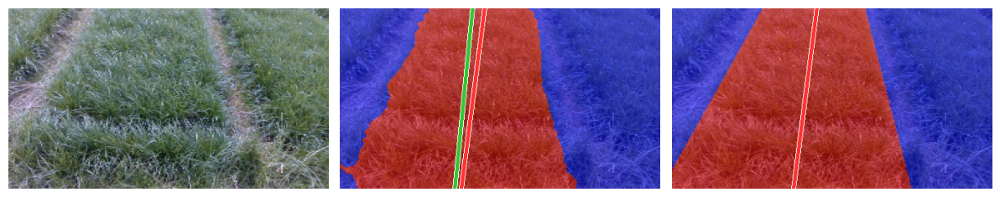

002 - Time: 041 ms - IoU: 0.341 - Err_val1: 3.000 - Err_val2: 7.000 - Err_Line: 5.00 px - sim_field_5_img.png


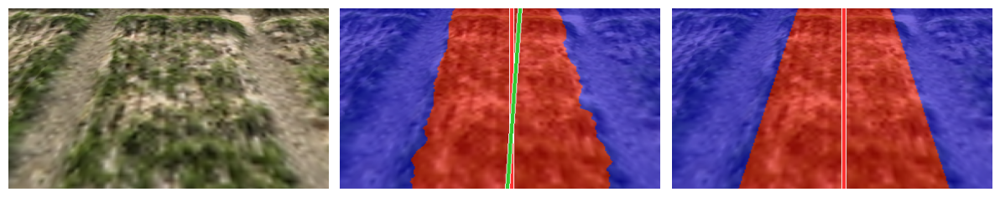

003 - Time: 039 ms - IoU: 0.336 - Err_val1: 15.000 - Err_val2: 22.000 - Err_Line: 18.50 px - sim_field_7_img.png


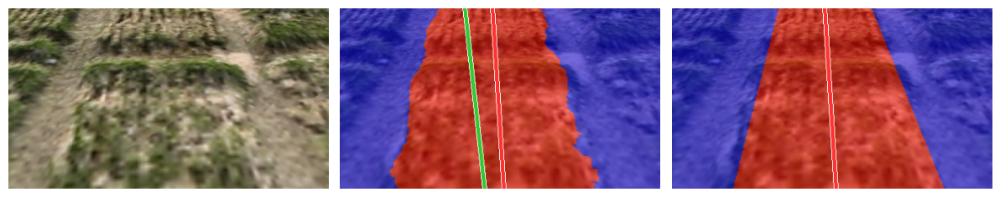

In [41]:
start = 0
finish = 3

out0 = plot_predictions(test_images[start:finish], colormap, model=model)

Random indices:
[82 92 23 70 13 24 31 65 54 72 43 64 99 45 17 14  8 26 62 79]

001 - Time: 041 ms - IoU: 0.393 - Err_val1: 19.000 - Err_val2: 1.000 - Err_Line: 10.00 px - phone_field_207_img.png


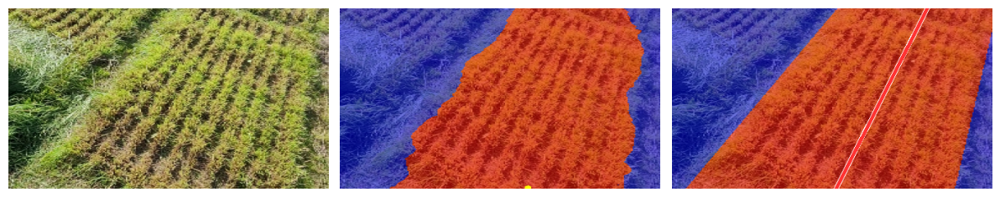

002 - Time: 039 ms - IoU: 0.299 - Err_val1: 10.000 - Err_val2: 7.000 - Err_Line: 8.50 px - phone_field_284_img.png


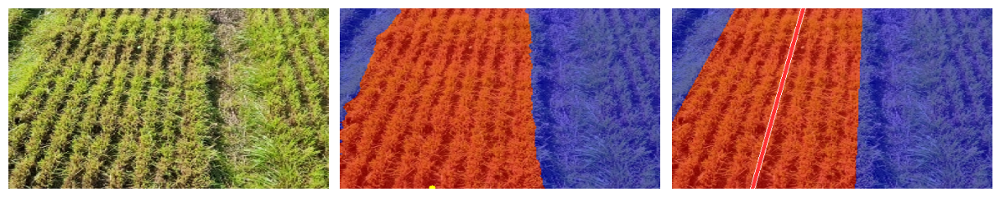

003 - Time: 041 ms - IoU: 0.400 - Err_val1: 78.000 - Err_val2: 24.000 - Err_Line: 51.00 px - sim_field_64_img.png


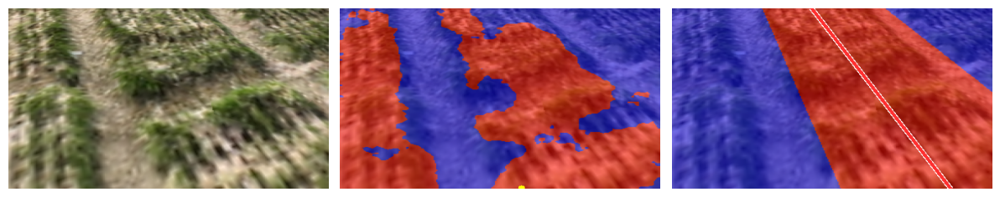

004 - Time: 039 ms - IoU: 0.340 - Err_val1: 0.000 - Err_val2: 1.000 - Err_Line: 0.50 px - sim_field_191_img.png


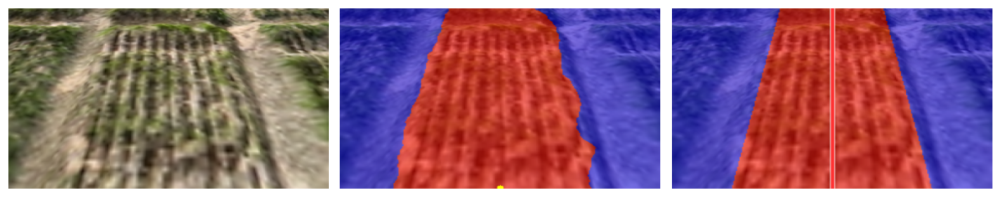

005 - Time: 039 ms - IoU: 0.323 - Err_val1: 14.000 - Err_val2: 6.000 - Err_Line: 10.00 px - erik_image_0034_img.png


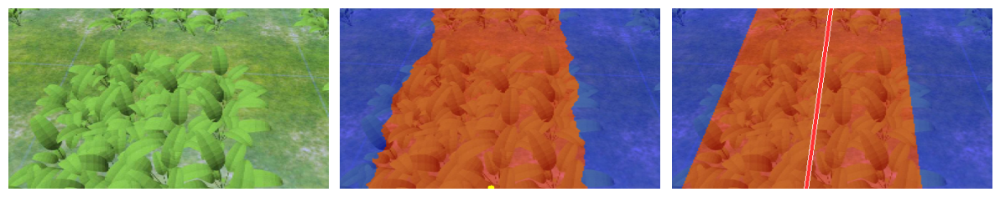

006 - Time: 045 ms - IoU: 0.367 - Err_val1: 8.000 - Err_val2: 2.000 - Err_Line: 5.00 px - phone_field_65_img.png


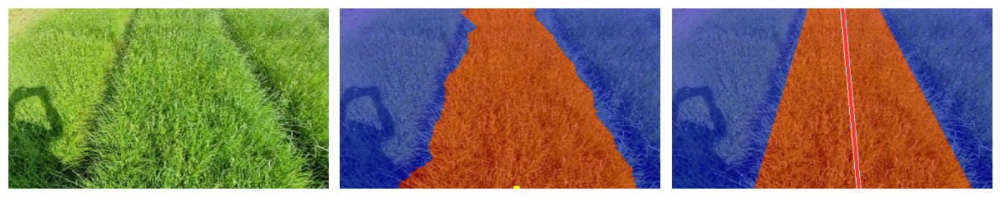

007 - Time: 040 ms - IoU: 0.375 - Err_val1: 7.000 - Err_val2: 2.000 - Err_Line: 4.50 px - phone_field_90_img.png


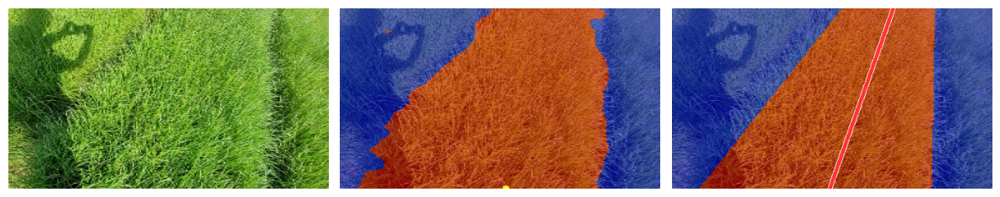

008 - Time: 040 ms - IoU: 0.363 - Err_val1: 27.000 - Err_val2: 11.000 - Err_Line: 19.00 px - image_0182_img.png


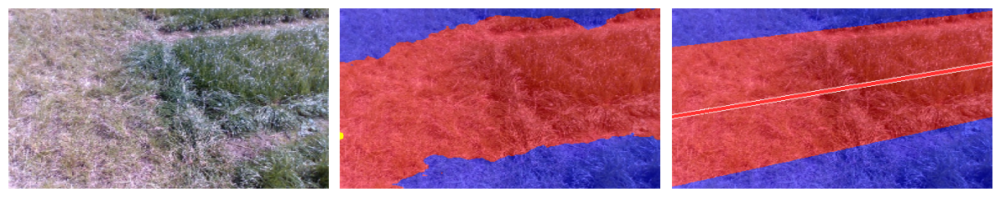

009 - Time: 042 ms - IoU: 0.333 - Err_val1: 9.000 - Err_val2: 4.000 - Err_Line: 6.50 px - phone_field_144_img.png


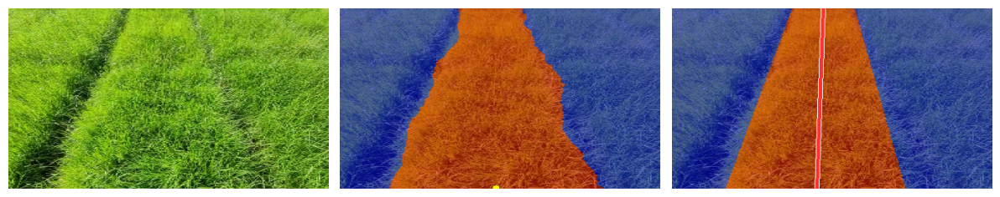

010 - Time: 041 ms - IoU: 0.348 - Err_val1: 0.000 - Err_val2: 12.000 - Err_Line: 6.00 px - sim_field_194_img.png


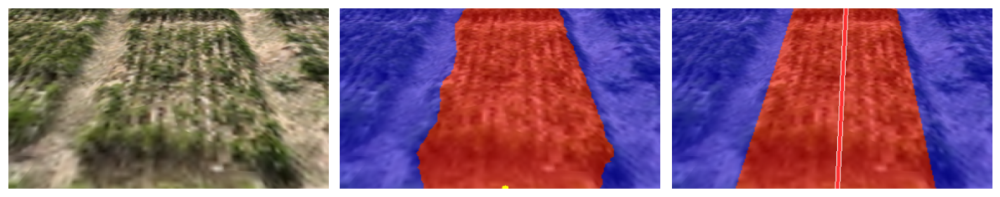

011 - Time: 040 ms - IoU: 0.334 - Err_val1: 4.000 - Err_val2: 9.000 - Err_Line: 6.50 px - sim_field_112_img.png


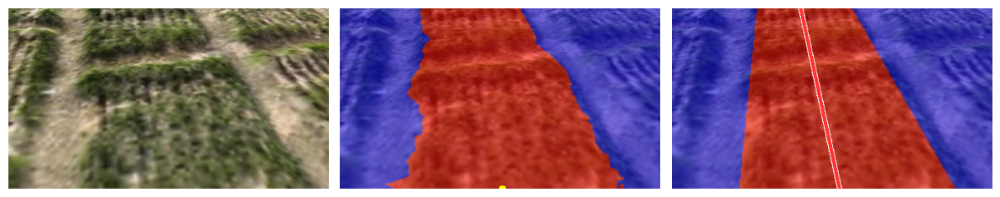

012 - Time: 043 ms - IoU: 0.347 - Err_val1: 1.000 - Err_val2: 5.000 - Err_Line: 3.00 px - sim_field_178_img.png


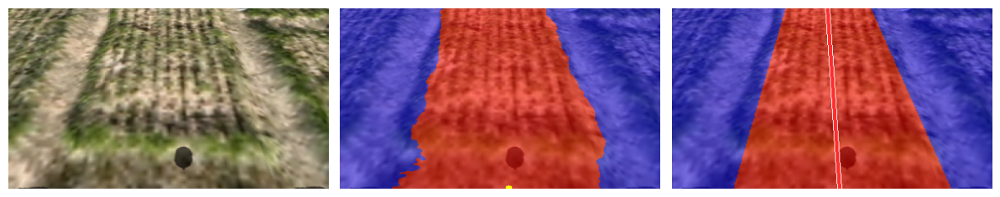

013 - Time: 064 ms - IoU: 0.320 - Err_val1: 85.000 - Err_val2: 2.000 - Err_Line: 43.50 px - phone_field_369_img.png


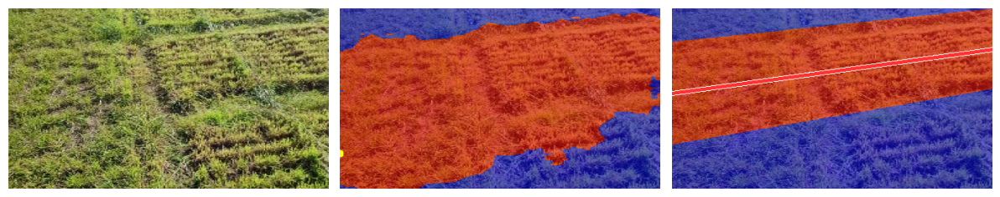

014 - Time: 043 ms - IoU: 0.322 - Err_val1: 2.000 - Err_val2: 4.000 - Err_Line: 3.00 px - erik_image_0118_img.png


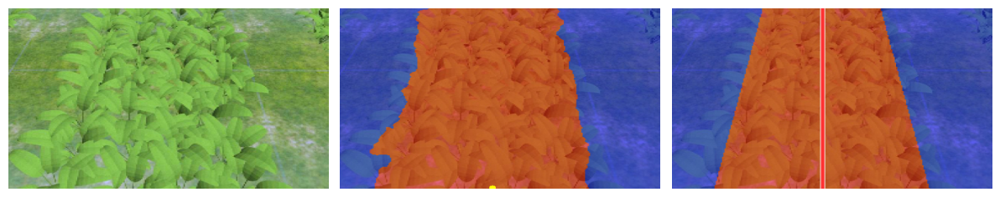

015 - Time: 039 ms - IoU: 0.379 - Err_val1: 5.000 - Err_val2: 14.000 - Err_Line: 9.50 px - erik_image_0046_img.png


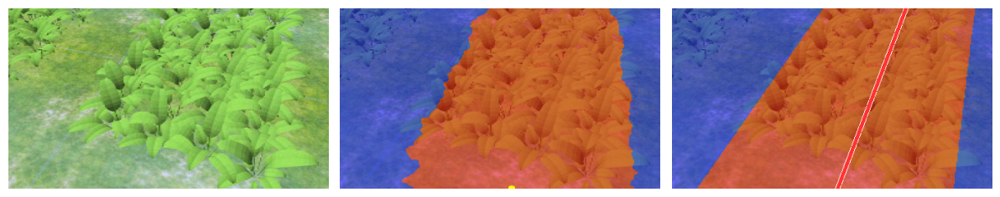

016 - Time: 041 ms - IoU: 0.262 - Err_val1: 13.000 - Err_val2: 1.000 - Err_Line: 7.00 px - image_0034_img.png


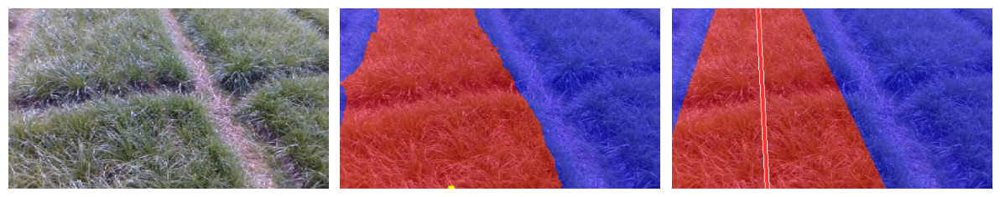

017 - Time: 043 ms - IoU: 0.370 - Err_val1: 12.000 - Err_val2: 8.000 - Err_Line: 10.00 px - sim_field_19_img.png


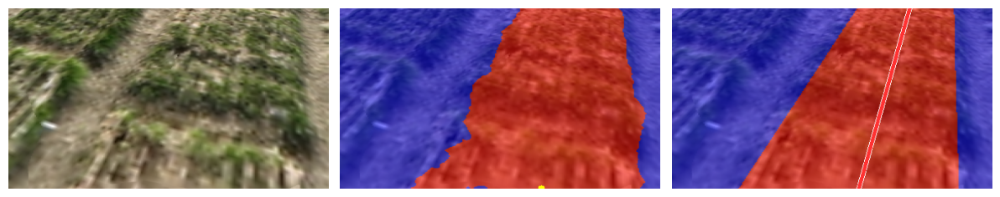

018 - Time: 042 ms - IoU: 0.337 - Err_val1: 36.000 - Err_val2: 6.000 - Err_Line: 21.00 px - sim_field_66_img.png


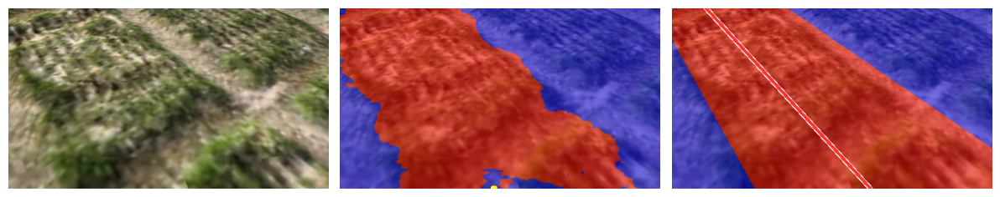

019 - Time: 041 ms - IoU: 0.324 - Err_val1: 9.000 - Err_val2: 16.000 - Err_Line: 12.50 px - phone_field_173_img.png


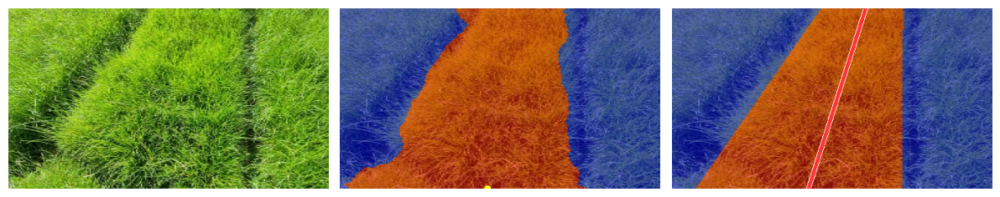

020 - Time: 043 ms - IoU: 0.295 - Err_val1: 7.000 - Err_val2: 1.000 - Err_Line: 4.00 px - image_0203_img.png


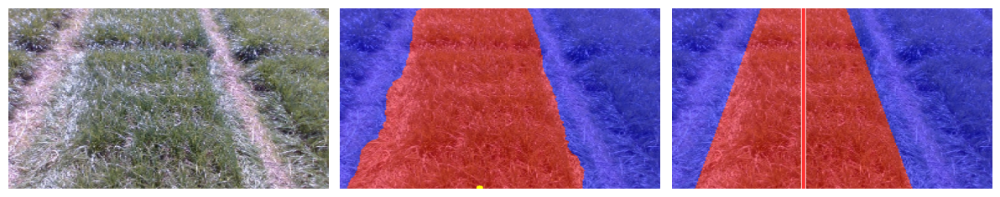

Total time:  6.985093593597412


In [39]:
random_indices = np.random.choice(len(test_images), size=20, replace=False)

print("Random indices:")
print( random_indices)
print("")
test_images_np = np.array(test_images)

start_time = time.time()
out0 = plot_predictions(test_images_np[random_indices], colormap, model=model)
end_time = time.time()

total_time = end_time - start_time
print("Total time: ", total_time)